# 1. Performace von Machine-Learning-Architekturen zur Evaluation von Wappen-Ähnlichkeiten

Bereits vor dem Aufkommen moderner Deep-Learning-Architekturen wurden Machine-Learning-Methoden entwickelt, mit der die Ähnlichkeit von Bildern evaluatiert werden kann. Solche System können dafür genutzt werden, mit einem Query- oder Suchbild, ähnliche Bilder in einer Datenbank zu finden, wie auch zu der Erkennung von Zahlen und Buchstaben in Bilddateiten genutzt werden. In dieser Arbeit sollen verschiedene Architekturen jedoch dafür evaluiert werden, wie gut sie sich zur Nutzung im Kontext von Wappen-Scans eignen.

Wappen beziehungsweise Wappenscans besitzen stellen dabei eine besondere Herausfoderung dar. Im Vergleich zu einer Datenbank unterschiedlichster Objekte wie Häusern und Autos, sind sie in ihrer Grundstruktur bereits sehr ähnlich. In dieser Arbeit wird nur das Wappenschild betrachtet, dabei können in den Scan-Ausschnitten der Hintergrund leicht 50 % der kompletten Bilddatei ausmachen, diese sind schnell "ähnlich", ohne dass das Wappen selbst dabei ähnlich sein muss. Weiterhin soll ein Fokus auf den geometrischen Formen liegen, die Farbgebung ist sekundär eine Rolle spielen.

In dieser Arbeit werden dazu Architekturen die auf Principal Component Analysis (PCA), t-distributed stochastic neighbor embedding (t-SNE), Uniform Manifold Approximation and Projection (UMAP) und Convolutional neural network (CNN) aufbauen, verglichen. Allen Ansätzen gemein ist, dass sie eine Vektor-Repräsentation der Ursprüngsbilder erzeugen, diese Vektorrepäsentationen werden verglichen um einen Ähnlichkeitsmaß zu berechnen anhand derer die ähnlichsten Bilder gefunden werden sollen.

# 2. Vorgehen und Methode

Diese Arbeit hat nicht den Anspruch eine allgemeine Evaluation der Methoden vorzunehmen, sondern die Methoden für diese spezifische Aufgabe zu testen. Die Architekturen werden deshalb nur sehr allgemein vorgestellt, es findet keine tiefe Auseinadersetzung mit den dahinterliegenden Konzepten statt, stattdessen geht es nur um die Messung der Performance. Eine solche Untersuchung wäre sicherlich interessant, würde jedoch dennoch den Rahmen dieser Arbeit sprengen.

Alle Modelle haben eine Reihe von Parametern, die sich stark auf ihre Performance für diese Aufgabe auswirken. Im folgenden werden diese versucht, zu einem gewissen Grad zu optimieren, durch iterative Anpassung dieser. Ziel in dieser Arbeit ist es jedoch noch nicht, für jedes Modell bereits das Optimum zu erhalten, sondern eine realistische Einschätzung zu erhalten, welche Architektur(en) für diese Aufgabe grundsätzlich gute Ergebnisse erzielen und sich für eine vertiefende Optimierung eignen.

Die Trainingsdaten bestehen aus rund 3000 Scans von Wappen, die für diese Arbeit bereit gestellt wurden. Die Scans haben unterschiedliche Auflösungen und Quellen. Teile der Wappen haben eine Drehung in der Originalquelle, Teile des Datensatzes enthalten mehr Wappenbestandteile als nur das Schild. Die Trainingsdaten für PCA, t-SNE und UMAP wurden vorab auf 100x100 skaliert (respektive 40x40, siehe das folgende Kapitel), dabei wurde die längere Seite auf 100 Pixel länge gebracht, das Bild zentriert und auf einen schwarzen Hintergrund gesetzt. Eine Matrix aller Pixelwerte wurde in einer CSV gespeichert, dadurch müssen die Bildtransformationen nicht für jeden Trainingsvorgang neu durchgeführt werden.
Das CNN-Model liest und transformiert dagegen die Daten während des Trainings.

Um die verschiedenen Ansätze zu evaluieren und innerhalb der Ansätze bestimmte Methodenvariablen besser einstellen zu können, wurde für 14 Wappenscans händisch ein Referenzkorpus erstellt, das die entsprechenden ähnliche Wappendateien beinhaltet. Diese sind auch Teil des Trainings, die Idee dabei ist, dass auch die "Selbsterkennung" gemessen werden kann.

# 3. Modell-Architekturen
## 3.1 PCA-Modell



Principal Component Analysis (PCA) ist eine Technik zur Reduktion von Dimensionalität, dabei wird ein Vektor korrellierender Variablen in seiner Dimension vermindert und umgewandelt in einen Vektor unkorrellierender Variablen.[[PCA-1]](#ref_2_1-1)

PCA kommt in vielen verschiedenen Kontexten zum Einsatz, ermöglicht jedoch gerade in Fällen, in denen wenige Daten vorhanden sind gute Ergebnisse. Eine bekannte Nutzung ist für den Eigenfaces-Algorithmus zur Gesichtserkennung.[[PCA-2]](#ref_2_1-2) Die folgende Implementierung ist deshalb auch daran angelehnt.

Die Bilddateien mit den Scans wurden hierfür mithilfe eines Hilftsscripts (siehe `create_training_data.py`) in eine CSV-Tabelle umwandelt, jede Zeile repräsentiert ein Bild, die Spalten einen Pixel. Bilder die nicht perfekt quatratisch sind, werden dabei zentriert und mit schwarzen Pixeln gepadded.

Die Bildgröße wird damit zu einem der zwei Parameter für die Arbeit mit der PCA-Technik, die weitere ist die Anzahl der Komponenten, die dabei genutzt wird.

In [1]:
from model_pca import train_pca_model, compare, plot_similar_pca, test_model_pca
from helper_functions import plot_plots
import pandas as pd

### 2.1.1 Inputgröße
Für die Verifizierung der Bildgröße wird hier mit einer sehr kleinen Stichprobe gearbeitet, die tatsächlich marginal bessere Ergebnisse für eine Bildgröße 

In [13]:
# Load data
coa_data_40 = pd.read_csv('../data/training-data_40x40_rgb.csv')

In [17]:
# Create PCA model with 40x40 image
pca_40, pca_features_40, size_40 = train_pca_model(coa_data_40)

In [2]:
test_img = ['-1_O B lion rampant.jpg', 
            '69_O G chief.jpg', 
            '22351_G E 3 chevrons.jpg', 
            '8363_ 3 fleurs-de-lis; 3 lions passt guard; =; =  {BO, GO}.jpg']

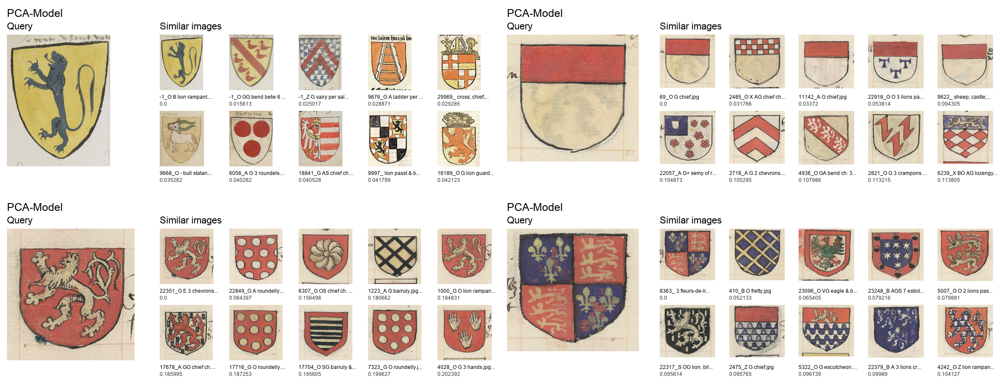

In [19]:
pca_40_plot = []
for img in test_img:
    pca_40_plot.append(plot_similar_pca('../data/coa_renamed/' + img, coa_data_40, pca_40, pca_features_40, size_40))
plot_plots(pca_40_plot)

In [20]:
print(test_model_pca(coa_data_40, pca_40, pca_features_40, size_40))

score: 4, secondary score: 1, self: 14/14


In [4]:
# Load data
coa_data = pd.read_csv('../data/training-data_100x100_rgb.csv')

In [9]:
# Create PCA model with 100x100 image
pca_100, pca_features_100, size_100 = train_pca_model(coa_data)

In [10]:
print(test_model_pca(coa_data, pca_100, pca_features_100, size_100))

score: 3, secondary score: 2, self: 14/14


Die Ergebnisse des Tests ergeben zwar für beide Bildgrößen einen Gesamtscore von fünf als ähnlich erkannten Wappen, jedoch ist für den 40x40 Input ein Primärwappen mehr erkannt worden. Daneben sind bei beide Architekturen auch die Selbstreferenz erkannt worden. Das 40x40-Input-Ergbnis ist zwar besser, darauß sollte nicht per se abgeleitet werden, dass eine geringere Input-Dimension besser ist, die Ergebnisse sind dabei nicht signifikant, aber es bedeutet vor allem, dass der geringere Dateninput keine Qualitätsminderung bedeutet.

### 2.2.2 Anzahl der Komponenten
Die wichtigste Variable für das PCA-Modell ist die Zahl der Komponenten, also die Zahl der Feature-Dimensionen, die die reduzierten Informationen beinhalten. Jede dieser Komponenten erklärt einen unterschiedlichen Anteil an der Varianz zwischen den Input-Variablen, das Ziel ist es, eine geringe Zahl von Komponenten zu nutzen, die jedoch eine möglichst hohe Zahl der ursprünglichen Informationen repräsentiert, eben die namensgebenden Principal Components. Wenn wir diese Komponenten absteigend ihrer Varianzerklärung anordnenen, können wir plotten, wieviele Komponenten wir für die jeweilige kumulierte Erklärung der Varianz benötigen:

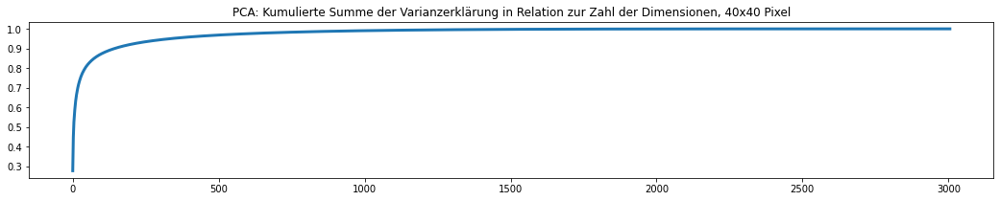

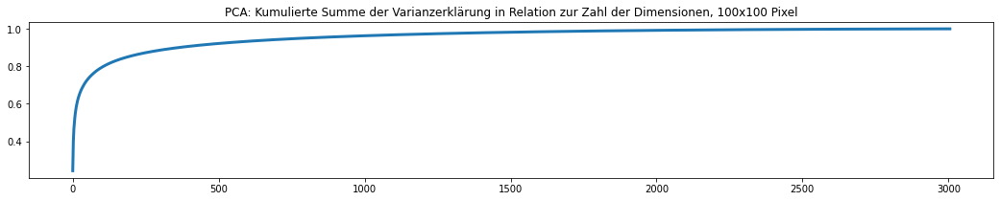

In [27]:
import matplotlib.pyplot as plt

pca_40_explained, _, _ = train_pca_model(coa_data_40, True)
plt.figure(figsize=(18, 3))
plt.plot(pca_40_explained.explained_variance_ratio_.cumsum(), lw=3)
plt.title('PCA: Kumulierte Summe der Varianzerklärung in Relation zur Zahl der Dimensionen, 40x40 Pixel')
plt.show()

pca_100_explained, _, _ = train_pca_model(coa_data, True)
plt.figure(figsize=(18, 3))
plt.plot(pca_100_explained.explained_variance_ratio_.cumsum(), lw=3)
plt.title('PCA: Kumulierte Summe der Varianzerklärung in Relation zur Zahl der Dimensionen, 100x100 Pixel')
plt.show()

In [28]:
import numpy as np
print('Anzahl von Dimensionen um 80 % der Varianz zu erklären (40x40):', len(np.where(pca_40_explained.explained_variance_ratio_.cumsum() < 0.80)[0]))
print('Anzahl von Dimensionen um 90 % der Varianz zu erklären (40x40):', len(np.where(pca_40_explained.explained_variance_ratio_.cumsum() < 0.90)[0]))
print('Anzahl von Dimensionen um 95 % der Varianz zu erklären (40x40):', len(np.where(pca_40_explained.explained_variance_ratio_.cumsum() < 0.95)[0]))
print('Anzahl von Dimensionen um 80 % der Varianz zu erklären (10x100):', len(np.where(pca_100_explained.explained_variance_ratio_.cumsum() < 0.80)[0]))
print('Anzahl von Dimensionen um 90 % der Varianz zu erklären (10x100):', len(np.where(pca_100_explained.explained_variance_ratio_.cumsum() < 0.90)[0]))
print('Anzahl von Dimensionen um 95 % der Varianz zu erklären (10x100):', len(np.where(pca_100_explained.explained_variance_ratio_.cumsum() < 0.95)[0]))

Anzahl von Dimensionen um 80 % der Varianz zu erklären (40x40): 43
Anzahl von Dimensionen um 90 % der Varianz zu erklären (40x40): 144
Anzahl von Dimensionen um 95 % der Varianz zu erklären (40x40): 334
Anzahl von Dimensionen um 80 % der Varianz zu erklären (10x100): 106
Anzahl von Dimensionen um 90 % der Varianz zu erklären (10x100): 362
Anzahl von Dimensionen um 95 % der Varianz zu erklären (10x100): 788


Um also 90 % der Varianz bei 40x40-Input zu erklären, benötigen wir 138 Komponenten, bei dem 100x100-Input sind es dagegen sogar 350 Komponenten. Diese Zahlen sind in dem Kontext zu betrachten, dass beispielsweise die ursprüngliche RGB-100x100-Matrix 30.000 Datenpunkte beinhaltet, es findet also eine massive Reduktion der Zahl der Informationen statt, während trotzdem noch über 90 % der ursprünglichen Varianz erklärt werden können. Die bisherigen Systemen arbeiteten mit 20 Komponenten, wenn wir nun die jeweilige Zahl der Komponenten für 90%-Varianzerklärung nutzen, erhalten wir nun deutlich bessere Ergebnisse:

In [14]:
pca_40_138, pca_features_40_138, size_40_138 = train_pca_model(coa_data_40, False, 138)
print(test_model_pca(coa_data, pca_40_138, pca_features_40_138, size_40_138))

score: 4, secondary score: 2, self: 14/14


In [5]:
pca_100_350, pca_features_100_350, size_100_350 = train_pca_model(coa_data, False, 350)
print(test_model_pca(coa_data, pca_100_350, pca_features_100_350, size_100_350))

score: 5, secondary score: 4, self: 14/14


Damit sind die Gesamt-Score-Ergebnise von 5 auf 6 respektive 9 erkannte ähnliche Wappen gestiegen, mit besseren Ergebnissen für das 100x100-PCA-Modell. Nun können lässt sich auch testen, ob das Modell bessere Ergebnisse erzielt, wenn wir 773 Dimensionen nutzen, die nun 95 % anstatt 90 % der Varianz erklären, oder aber, ob 106 Dimensionen, die 80 % erklären auch reichen:

In [18]:
pca_100_773, pca_features_100_773, size_100_773 = train_pca_model(coa_data, False, 773)
print(test_model_pca(coa_data, pca_100_773, pca_features_100_773, size_100_773))

score: 5, secondary score: 4, self: 14/14


In [29]:
pca_100_106, pca_features_100_106, size_100_106 = train_pca_model(coa_data, False, 106)
print(test_model_pca(coa_data, pca_100_106, pca_features_100_106, size_100_106))

score: 4, secondary score: 3, self: 14/14


Beides ist nicht der Fall, 106 Komponenten liefern schlechtere Ergebnisse, die 773 Komponenten jedoch nicht bessere als die 350, stattdessem dauert nun das Ausführen und der Vergleich länger. Da der Zweck der Vergleich unterschiedlicher Wappenscans ist, führt ab einem gewissen Punkt die Zugabe weiterer Informationen nicht zu besseren Ergebnissen. Jeder Scan ist anders, nicht jede Variation, beispielsweise im Rauschen des Pixelhintergrund, führt zu einen Zugewinn an Vergleichbarkeit. Die Dimensionalität von 350 führt für diesen Verwendungszweck offensichtlich zu den besten Ergebnissen.

In [6]:
pca = pca_100_350
pca_features = pca_features_100_350
size_pca = size_100_350

Diese Ergebnisse können wir für die oberen vier ausgewählten Wappen auch noch mal illustrieren:

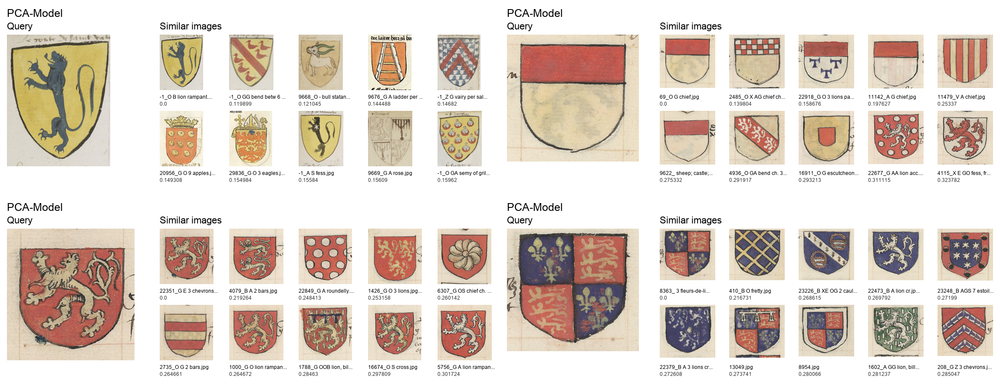

In [23]:
pca_plot = []
for img in test_img:
    pca_plot.append(plot_similar_pca('../data/coa_renamed/' + img, coa_data, pca, pca_features, size_pca))
plot_plots(pca_plot)

## 3.2 t-SNE

T-distributed Stochastic Neighbor Embedding (t-SNE) ist wie PCA ein System zur Reduktion der Dimensionalität von Daten, ein wichtiger Unterschied zu PCA ist, dass es sich dabei um eine Nicht-lineare Reduktion handelt, die iterativ arbeitet. 
Grundsätzlich gibt es dabei das Potenzial lokale Ähnlichkeiten zu finden, etwas das gerade für Scans, bei denen die Wappen-Positionierung variert sinnvoll sein kann. Gleichzeitig ist die Dimensionsreduktion dabei sehr stark, entweder auf zwei oder drei Dimensionen, weshalb es auch hauptsächlich für die visuelle Darstellung multidimensionaler Daten verwendet wird.

In [4]:
from model_tsne import train_tsne_model, compare_tsne, plot_similar_tsne, test_model_tsne

### 3.2.1 Perplexität

Vereinfacht gesagt bestimmt die Perplexität, wie die Aufmerksamkeit zwischen lokalen und globalen Aspekten der Daten verteilt wird, dabei ist das Parameter auch eine Art Schätzung der Anzahl der nahen Nachbarn, die jeder Datenpunkt hat.[[t-SNE-1]](#ref_3_2-1)

In [7]:
for perplexity in [3,5,10,20,30,50,70]:
    tsne_result, size = train_tsne_model(coa_data, n_components=3, learning_rate=250, perplexity=perplexity)
    print("Perplexity:", perplexity, "Results:", test_model_tsne(coa_data, tsne_result))

### 3.2.2 Anzahl der Komponenten
Wie bei PCA lassen sich bei t-SNE die Zahl der Komponenten wählen, in einem sehr eingeschränkten Umfang, entweder 2 oder 3:

In [10]:
for n_components in [2,3]:
    tsne_result, size = train_tsne_model(coa_data, n_components, learning_rate=250, perplexity=10)
    print("Komponenten:", n_components, "Result:", test_model_tsne(coa_data, tsne_result))

### 3.2.3 PCA-Vorabreduktion

Für die Nutzung von t-SNE wird empfohlen um die Dimensionen vorab zu reduzieren - in der Dokumentation des entsprechenden sklearn-Packages beispielsweise wird 50 empfohlen, wenn eine hohe Dimensionalität vorliegt. In diesem Fall war liegt diese bei 30.000, mit PCA lässt sich das entsprechend schnell implementieren und testen. Dabei ist zu beachten, dass dabei bereits ein Teil der Informationen verloren geht:

In [11]:
for pca_comp in [30,50,106,350]:
    tsne_result, size = train_tsne_model(coa_data, n_components=3, pca=True, pca_comp=pca_comp, learning_rate=250, perplexity=5)
    print("PCA-Komponenten:", pca_comp, "Result:", test_model_tsne(coa_data, tsne_result))

Leider führt auch die Vorabreduktion nicht zu Ergebnissen, die an PCA herankommen. Zwei oder drei Dimensionen sind zu wenig, um sinnvolle Ergebnisse bei dem Ähnlichkeitsvergleich zu erhalten.

## 3.3 UMAP
Uniform Manifold Approximation and Projection (UMAP) ist eine weitere nichtlineare Dimensionsreduktionstechnik, die laut den Autor:innen der Methode, bessere Ergebnisse liefert als TSNE bei einem ähnlichen Einsatzzweck. Zudem besitzt es keine Einschränkungen hinsichtlich der Zahl der Komponenten/Dimensionen wie TSNE und ermöglicht auch die spätere Einbettung in den Projektsraum - anders als TSNE.[[UMAP-1]](#ref_2_3-1)

Gleichzeitig ist UMAP nicht-deterministisch, Embeddings unterscheiden sich in unterschiedlichen Anläufen, dies kann auch durch das Setzen eines Seeds nicht geändert werden.

Die Test-Funktion für UMAP gibt zusätzlich zu der "self"-Zahl, also des Matches des Abfragewappens auch, ob das Abfragewappen zumindest unter den Top-10-ähnlichen Wappen ist: Der Grund ist gleich leicht ersichtlich, anders als PCA und t-SNE führt der nicht-determinismus der Emeddings dazu, dass diese eben nicht immer zum Top-1-Match führt.

In [8]:
from model_umap import train_umap_model, compare_umap, plot_similar_umap, test_model_umap

### 3.3.1 Komponenten
Wie bei PCA und TSNE lässt sich auch für UMAP die Anzahl der Komponenten bzw. Dimensionen setzen, hier sind zwischen 2 und 100 sinnvoll.[[UMAP-2]](#ref_2_3-2)

In [6]:
for components in [3, 5, 10, 20, 35, 50, 80]: 
    trans, size = train_umap_model(coa_data, n_components=components)
    
    print("Komponenten:", components, "Ergebnis:", test_model_umap(coa_data, trans, size))

Komponenten: 3 Ergebnis: score: 0, secondary score: 2, self: 1/14, self in top-10: 9/14
Komponenten: 5 Ergebnis: score: 1, secondary score: 2, self: 2/14, self in top-10: 11/14
Komponenten: 10 Ergebnis: score: 1, secondary score: 2, self: 5/14, self in top-10: 12/14
Komponenten: 20 Ergebnis: score: 1, secondary score: 2, self: 6/14, self in top-10: 13/14
Komponenten: 35 Ergebnis: score: 1, secondary score: 2, self: 2/14, self in top-10: 13/14
Komponenten: 50 Ergebnis: score: 1, secondary score: 2, self: 5/14, self in top-10: 13/14
Komponenten: 80 Ergebnis: score: 1, secondary score: 1, self: 4/14, self in top-10: 12/14


In [8]:
for components in [3, 5, 10, 20, 35, 50, 80]: 
    trans, size = train_umap_model(coa_data, n_components=components, n_neighbors=35)
    
    print("Komponenten:", components, "Ergebnis:", test_model_umap(coa_data, trans, size))

Komponenten: 3 Ergebnis: score: 0, secondary score: 1, self: 3/14, self in top-10: 10/14
Komponenten: 5 Ergebnis: score: 3, secondary score: 2, self: 5/14, self in top-10: 13/14
Komponenten: 10 Ergebnis: score: 2, secondary score: 1, self: 8/14, self in top-10: 12/14
Komponenten: 20 Ergebnis: score: 1, secondary score: 2, self: 4/14, self in top-10: 13/14
Komponenten: 35 Ergebnis: score: 2, secondary score: 2, self: 4/14, self in top-10: 13/14
Komponenten: 50 Ergebnis: score: 1, secondary score: 1, self: 5/14, self in top-10: 13/14
Komponenten: 80 Ergebnis: score: 0, secondary score: 2, self: 5/14, self in top-10: 12/14


Das beste Ergebnis liegt also bei 20 Komponenten vor.

### 3.3.2 Nachbarn

Mit dem Parameter der lokalen Nachbarschaft bestimmt, also wie viele Wappen in der nahen Stichprobe liegen dürfen, geringe Werte führen zu mehr lokalen Daten, globale eher zur Darstellung der Gesamtheit. Allgemein sollte der Wert zwischen 2 und 200 liegen, in dem vorherigen Test lag die Nachbarschaft bei 100.
https://umap-learn.readthedocs.io/en/latest/parameters.html

In [7]:
for neighbors in [5, 10, 20, 35, 50, 80, 100]: 
    trans, size = train_umap_model(coa_data, n_components=20, n_neighbors=neighbors)
    
    print("Nachbarn:", neighbors, "Ergebnis:", test_model_umap(coa_data, trans, size))

Nachbarn: 5 Ergebnis: score: 2, secondary score: 1, self: 9/14, self in top-10: 13/14
Nachbarn: 10 Ergebnis: score: 2, secondary score: 1, self: 6/14, self in top-10: 14/14
Nachbarn: 20 Ergebnis: score: 3, secondary score: 2, self: 4/14, self in top-10: 14/14
Nachbarn: 35 Ergebnis: score: 2, secondary score: 2, self: 4/14, self in top-10: 14/14
Nachbarn: 50 Ergebnis: score: 1, secondary score: 2, self: 5/14, self in top-10: 14/14
Nachbarn: 80 Ergebnis: score: 1, secondary score: 2, self: 3/14, self in top-10: 12/14
Nachbarn: 100 Ergebnis: score: 1, secondary score: 2, self: 5/14, self in top-10: 14/14


In [9]:
for neighbors in [5, 10, 20, 35, 50, 80, 100]: 
    trans, size = train_umap_model(coa_data, n_components=5, n_neighbors=neighbors)
    
    print("Nachbarn:", neighbors, "Ergebnis:", test_model_umap(coa_data, trans, size))

Nachbarn: 5 Ergebnis: score: 2, secondary score: 1, self: 5/14, self in top-10: 12/14
Nachbarn: 10 Ergebnis: score: 3, secondary score: 2, self: 6/14, self in top-10: 14/14
Nachbarn: 20 Ergebnis: score: 3, secondary score: 1, self: 5/14, self in top-10: 14/14
Nachbarn: 35 Ergebnis: score: 2, secondary score: 2, self: 4/14, self in top-10: 14/14
Nachbarn: 50 Ergebnis: score: 0, secondary score: 2, self: 5/14, self in top-10: 11/14
Nachbarn: 80 Ergebnis: score: 1, secondary score: 2, self: 3/14, self in top-10: 12/14
Nachbarn: 100 Ergebnis: score: 0, secondary score: 2, self: 2/14, self in top-10: 12/14


Bei 20 Komponenten wurde hier das beste Ergebnisse ergab mit einer Nachbarschaft von 20 erzielt mit einer Gesamtzahl von 5 Ähnlichkeitsmatches. Mit 5 respektive 10 sind die Selfmatches auf Platz-1 am höchsten, da jedoch alle Abfragebilder unter den Top-10 sind, ist dies für die Praktikabilität des Systems zweitrangig.

### 3.3.3 Mindestdistanz
Die Mindestdistanz bestimmt wie nahe das UMAP-Modell-Punkte setzen darf, geringe Werte führen also zu mehr "Klumpen" und eignen sich besser für Clustering, höhere Werte erhalten dagegen sind besser für die Darstellung topologischer Strukturen. In den bisherigen Beispielen lag der Wert bei 0.3, die Variable kann Werte zwischen  von 0.0 bis 0.99 annehmen.
https://umap-learn.readthedocs.io/en/latest/parameters.html

In [5]:
for min_dist in [0.0, 0.1, 0.3, 0.5, 0.6, 0.8]: 
    trans, size = train_umap_model(coa_data, n_neighbors=20, min_dist=min_dist, n_components=20)
    print("Mindestdistanz:", min_dist, "Ergebnis:", test_model_umap(coa_data, trans, size))

Mindestdistanz: 0.0 Ergebnis: score: 2, secondary score: 1, self: 4/14, self in top-10: 11/14
Mindestdistanz: 0.1 Ergebnis: score: 3, secondary score: 1, self: 4/14, self in top-10: 13/14
Mindestdistanz: 0.3 Ergebnis: score: 2, secondary score: 2, self: 4/14, self in top-10: 14/14
Mindestdistanz: 0.5 Ergebnis: score: 1, secondary score: 2, self: 5/14, self in top-10: 14/14
Mindestdistanz: 0.6 Ergebnis: score: 2, secondary score: 1, self: 6/14, self in top-10: 14/14
Mindestdistanz: 0.8 Ergebnis: score: 2, secondary score: 1, self: 9/14, self in top-10: 14/14


In [10]:
for min_dist in [0.0, 0.1, 0.3, 0.5, 0.6, 0.8]: 
    trans, size = train_umap_model(coa_data, n_neighbors=10, min_dist=min_dist, n_components=5)
    print("Mindestdistanz:", min_dist, "Ergebnis:", test_model_umap(coa_data, trans, size))

Mindestdistanz: 0.0 Ergebnis: score: 1, secondary score: 2, self: 2/14, self in top-10: 9/14
Mindestdistanz: 0.1 Ergebnis: score: 0, secondary score: 1, self: 5/14, self in top-10: 9/14
Mindestdistanz: 0.3 Ergebnis: score: 3, secondary score: 2, self: 5/14, self in top-10: 13/14
Mindestdistanz: 0.5 Ergebnis: score: 3, secondary score: 1, self: 7/14, self in top-10: 14/14
Mindestdistanz: 0.6 Ergebnis: score: 3, secondary score: 1, self: 5/14, self in top-10: 14/14
Mindestdistanz: 0.8 Ergebnis: score: 3, secondary score: 1, self: 9/14, self in top-10: 14/14


In [16]:
trans, size = train_umap_model(coa_data, n_neighbors=10, min_dist=0.3, n_components=5)
print("UMAP mit n_neighbors=10, min_dist=0.3, n_components=5 - Ergebnis:", test_model_umap(coa_data, trans, size))

UMAP mit n_neighbors=10, min_dist=0.3, n_components=5 - Ergebnis: score: 3, secondary score: 2, self: 4/14, self in top-10: 13/14


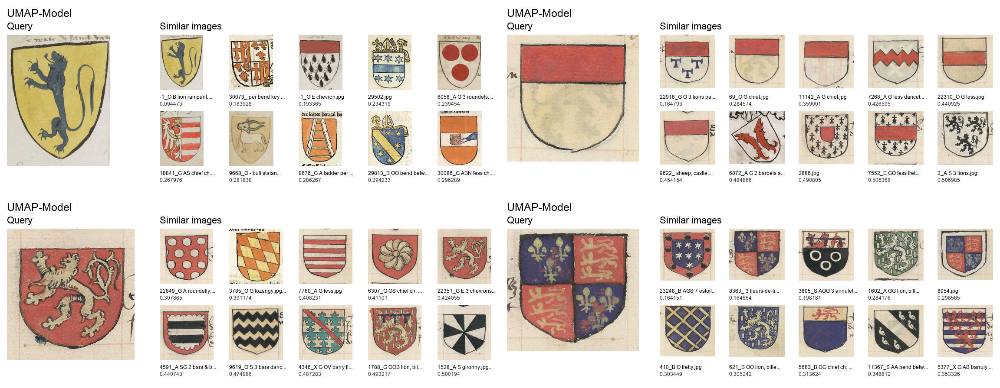

In [17]:
umap_plot = []
for img in test_img:
    umap_plot.append(plot_similar_umap('../data/coa_renamed/' + img, trans, coa_data, size))
plot_plots(umap_plot)

## 3.4 CNN-Modell

In [7]:
from cnn_model_rgb.torch_infer import compute_similar_images, set_vars, plot_similar_cnn

In [8]:
encoder, img_dict, embedding, device = set_vars()

Nachdem die entsprechenden Daten geladen sind, können wir das trainierte CNN-Modell testen:

In [9]:
from cnn_model_rgb.automated_test import test_model

In [10]:
print(test_model(encoder, img_dict, embedding, device))

score: 10, secondary score: 7, self: 14/14


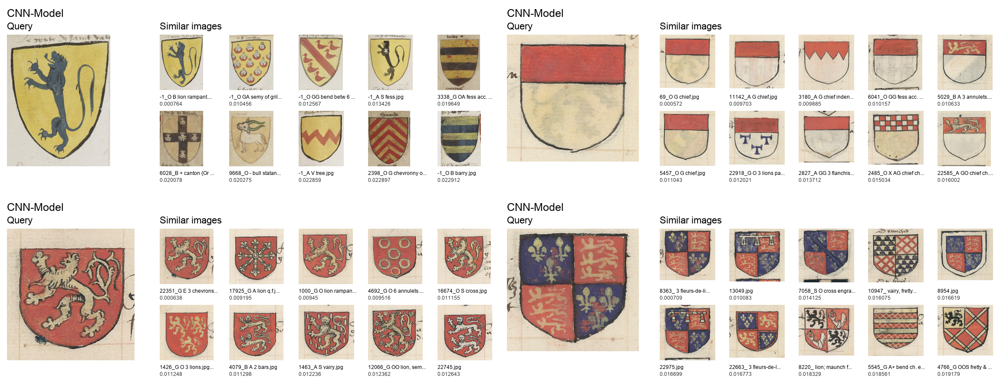

In [13]:
cnn_plot = []
for img in test_img:
    cnn_plot.append(plot_similar_cnn('../data/coa_renamed/' + img, embedding, encoder, device, img_dict))
plot_plots(cnn_plot)

## 3.5 Architekturvergleich

Die CNN-Architektur ist den anderen eindeutig überlegen, dennoch sind die Ergebnisse für PCA sehr bemerkenswert, erfordern sie doch deutlich weniger Rechenkapazität als das CNN-Modell und weniger speicherintensiv (CNN-Model ca. 200mb).

| Architektur | Primärmatches | Sekundärmatches | Summe | Selbstmatch |
|-------------|---------------|-----------------|-------|-------------|
| PCA         | 5             | 4               | 9     | 14/14       |
| t-SNE       |               |                 |       |             |
| UMAP        | 3             | 2               | 5     | 14/14       |
| CNN         | 10            | 7               | 17    | 14/14       |

Die PCA-Performance ließe sich sicherlich mit weiteren Vorverarbeitungsschritten, beispielweise durch edge_detection auf die Input-Daten, deutlich verbessern. Gleichzeitig sind die Ergebnisse der CNN-Architektur hierbei so vielversprechend, dass es als sinnvoll erscheint, diese weiterzuverfolgen.

Die Ergebnisse für t-SNE und UMAP dagegen zeigt recht eindeutig, dass ihre Nutzung für diese Aufgabe nicht sinnvoll ist.

# 5. Problemstellungen
## 5.1 Hintergrund & Auschnitt

Die folgenden Wappen zeigen ein Problem, dass allgemein vorhanden ist: Die Wappenschilder ähneln sich sehr stark, beide haben auf roten Hintergrund weißen Hintergrund je zwei Barben, der Hintergrund selbst enthält ein ähnliches, jedoch abweichendes Kleeblatt-Muster. Eigentlich sollten diese beiden Wappen gegenseitig in den Ergebnissen erscheinen. Dies ist jedoch nicht der Fall, der Grund dafür liegt in dem Hintergrund und Ausschnitt des zweiten Wappens, das Teile anderer Wappen an den Rändern enthält.

<img src="notebook_img/7938_G OO 2 barbels addorsed, trefly.jpg" alt="Wappen" style="height:200px; display:inline-block"/>
<img src="notebook_img/7807_G OOB 2 barbels addorsed, trefly & label.jpg" alt="Wappen" style=" height:200px; display:inline-block"/>

Das Autoencoding des Wappens versucht, den gesamten Bereich des Bildes zu codieren, die Pixelfläche, die nicht das Wappenschild abbildet, nimmt bei dem letzten Scan rund 50% ein (Schild: 215193 Pixel, gesamt: 427042 Pixel), die beiden Anschittbereiche machen zwar nur 8 % (34342 Pixel) aus. Darauß resultiert, dass die Wappen nicht matchen. Dies lässt sich im folgenden auch leicht überprüfen, der erste der beiden Plots zeigt den ursprünglichen Scans mit seinen Matches. Für das zweite wurde einfach der Rand abgeschnitten, nun wird das andere Wappen gematched - das eigentliche, aus dem der Ausschnitt stammt, dagegen nicht:

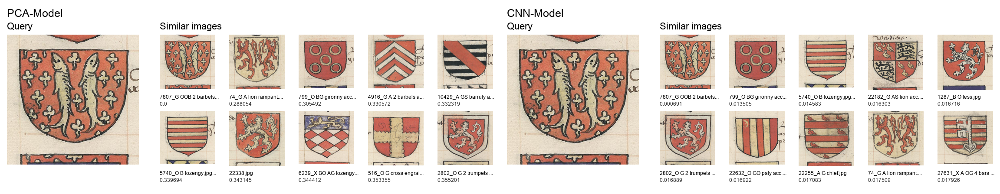

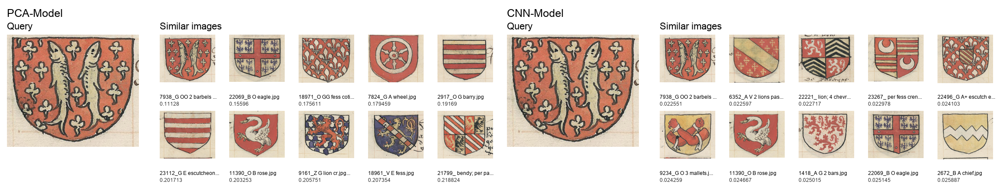

In [18]:
barb_examples = ['../data/coa_renamed/7807_G OOB 2 barbels addorsed, trefly & label.jpg',
                 '../data/coa_edited/7807_edited.jpg']

for bw in barb_examples:
    barb_examples_output = [plot_similar_pca(bw, coa_data, pca, pca_features, size_pca),
                            plot_similar_cnn(bw, embedding, encoder, device, img_dict)]
    display(plot_plots(barb_examples_output))

Diese Problematik lässt sich nicht durch beispielsweise mehr Trainingsdaten beheben. Der Vergleich der Scans funktioniert auf Basis der Vektorrepräsentationen der Wappen, diese enthalten eben auch die Ränder und Bereiche, die uns nicht interessieren.

Mögliche Lösungsansätze hierzu:
* Freistellung: Ein weiteres CNN, das den Hintergrund identifiziert und die Wappenschilder freistellt sowie die Bildmaße beschneidet. Hierfür müssten entsprechende Trainingsdaten erstellt werden.
* Automatisiertes Labeln: Ein CNN, das Labels predicted; diese als Input in das Ähnlichkeitssystem; die Bilddaten erhalten etwas weniger Wichtigkeit
* Vorverarbeitung: Fokus auf den inneren Bereich und die Formen durch ein Embedding der Kanten
* Ein einfacher (Javascript-)Bildeditor, der in dem Importdialog das Beschneiden (und Drehen) des Bildes ermöglicht.

## 5.2 Drehung
Das drittletzte Beispiel (10449) zeigt, dass alle hier vorgestellten Architekturen nicht mit Drehungen umgehen können. Ein anderes CNN-Modell wurde testweise mit randomisiert gedrehten Wappen trainiert, dies hatte jedoch starke Auswirkungen auf die Gesamtperformance, weshalb dem nicht weiter gefolgt wurde.

Die Problemstellung, bleibt auch erhalten, wenn das Wappen vor der Abfrage gedreht wird, unabhängig von der Hintergrundfarbe:

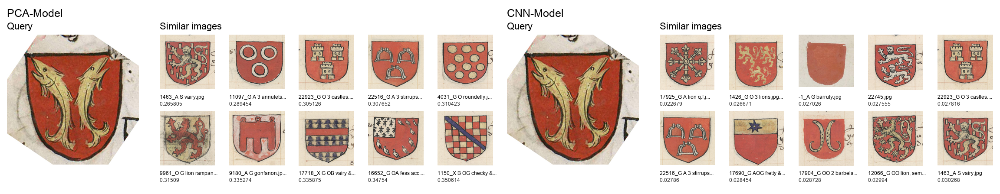

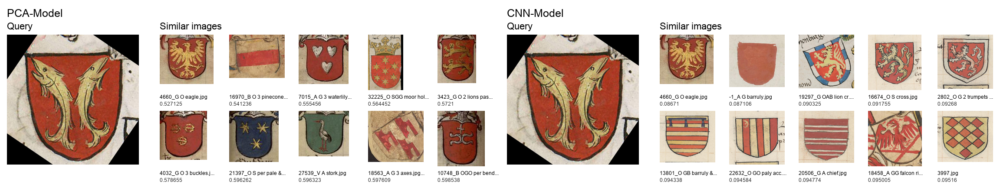

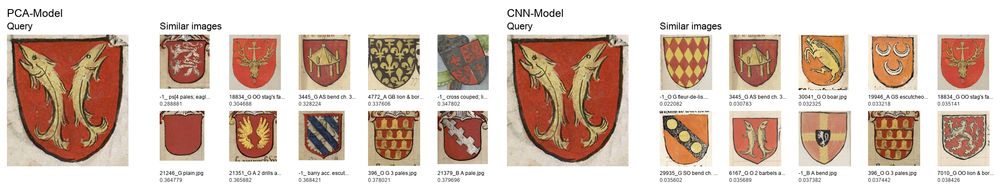

In [14]:
barb_examples = ['../data/coa_edited/10449_edited_3.jpg',
                 '../data/coa_edited/10449_edited.jpg',
                 '../data/coa_edited/10449_edited_2.jpg']

for bw in barb_examples:
    barb_examples_output = [plot_similar_pca(bw, coa_data, pca, pca_features, size_pca),
                            plot_similar_cnn(bw, embedding, encoder, device, img_dict)]
    display(plot_plots(barb_examples_output))

Was also wirklich hilft, ist das Drehen und Beschneiden des Wappens, danach wird das ensprechende ähnliche Wappen doch gefunden:

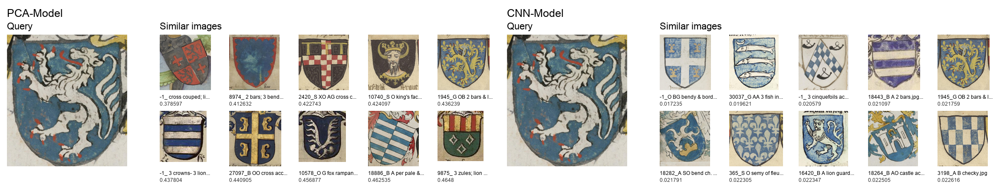

In [15]:
lion = '../data/coa_edited/32013_edited.jpg'
lion_output = [plot_similar_pca(lion, coa_data, pca, pca_features, size_pca),
               plot_similar_cnn(lion, embedding, encoder, device, img_dict)]
display(plot_plots(lion_output))

## 5.3 Schwarz-Weiß

In der aktuellen Version des CNN-Modells werden Schwarz-Weiß-Versionen, bzw. auch Versionen mit stark eingeschränkten Kontransumgang selten zugeordnet:

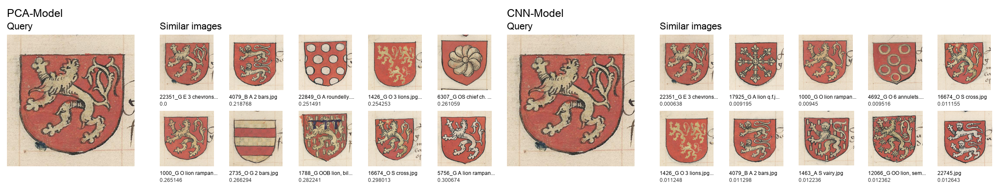

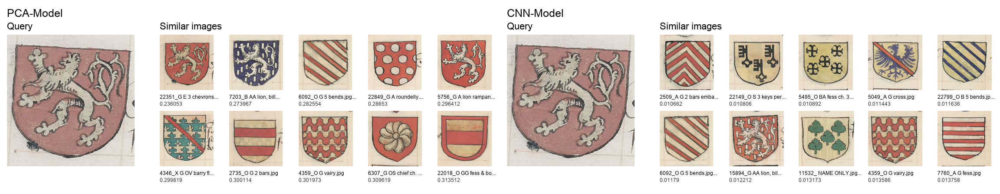

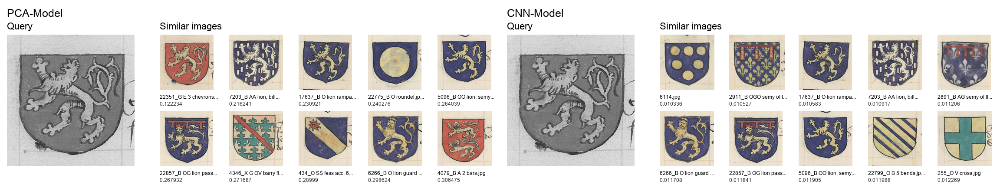

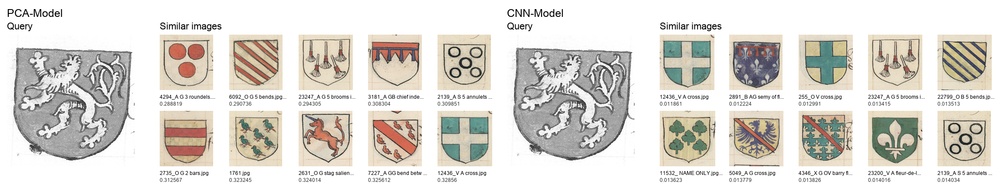

In [16]:
bw_examples = ['../data/coa/22351_G E 3 chevrons.jpg',
               '../data/coa_edited/22351_edited_3.jpg',
               '../data/coa_edited/22351_edited.jpg',
               '../data/coa_edited/22351_edited_2.jpg']

for bw in bw_examples:
    bw_output = [plot_similar_pca(bw, coa_data, pca, pca_features, size_pca),
                 plot_similar_cnn(bw, embedding, encoder, device, img_dict)]
    display(plot_plots(bw_output))

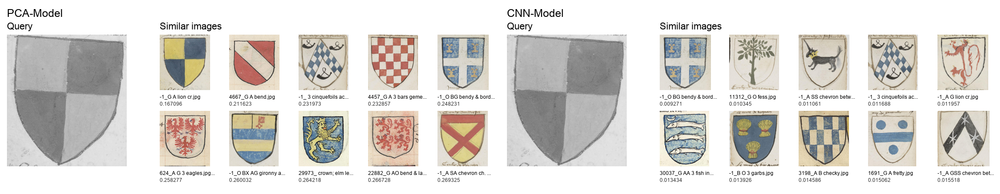

In [17]:
shield_bw_contrast = '../data/coa_edited/-1_edited.jpg'
bw_shield_output = [plot_similar_pca(shield_bw_contrast, coa_data, pca, pca_features, size_pca),
                    plot_similar_cnn(shield_bw_contrast, embedding, encoder, device, img_dict)]
display(plot_plots(bw_shield_output))

Dies ließe sich einerseits mit ausgerprägteren randomisierten Helligkeits-/Kontrast-Veränderungen sowie eben randomisierter Entfernung der Farben verbessern, außerde, durch den Input von Labels.

***

<a id="ref_2_1-1"></a>[PCA-1] Santhosh Kumar R, Principal Component Analysis: In-depth understanding through image visualization, medium.com Towards Data Science 2019,
https://towardsdatascience.com/principal-component-analysis-in-depth-understanding-through-image-visualization-892922f77d9f (abgerufen: 12.10.22).

<a id="ref_2_1-2"></a>[PCA-2] Dario Radečić, Eigenfaces — Face Classification in Python, medium.com Towards Data Science 2020,
https://towardsdatascience.com/eigenfaces-face-classification-in-python-7b8d2af3d3ea (abgerufen: 14.10.22).

<a id="ref_3_2-1"></a>[t-SNE-1] Martin Wattenberg, Fernanda Viégas, Ian Johnson, How to Use t-SNE Effectively, Distill, 2016, http://doi.org/10.23915/distill.00002 (abgerufen: 12.12.22).

<a id="ref_2_3-1"></a>[UMAP-1] Leland McInnes, John Healy, James Melville, UMAP: Uniform Manifold Approximation and Projection for Dimension Reduction, arxiv 2018, https://arxiv.org/abs/1802.03426 (abgerufen: 04.11.2022).

<a id="ref_2_3-2"></a>[UMAP-2] UMAP API Guide, UMAP, https://umap-learn.readthedocs.io/en/latest/api.html (abgerufen: 04.11.2022).